In [2]:
import pandas as pd, os, gc
import networkx as nx

# Import packages
%matplotlib inline
import matplotlib.pyplot as plt
from random import uniform, seed
import numpy as np
import time
from igraph import *
import heapq
from tqdm import tqdm

# Data

In [3]:
########### EMAIL DATASET
# https://snap.stanford.edu/data/email-Eu-core.html
# Source:
#     Hao Yin, Austin R. Benson, Jure Leskovec, and David F. Gleich. "Local Higher-order Graph Clustering." In Proceedings of the 23rd ACM SIGKDD International Conference on Knowledge Discovery and Data Mining. 2017.
#     J. Leskovec, J. Kleinberg and C. Faloutsos. Graph Evolution: Densification and Shrinking Diameters. ACM Transactions on Knowledge Discovery from Data (ACM TKDD), 1(1), 2007.

edges = pd.read_csv(r'data/email_eu/email-Eu-core.txt', sep=' ')
edges = edges.rename(columns={'0':'node_1', '1':'node_2'})

nvert = len(np.unique(edges.node_1.to_list()+edges.node_2.to_list()))
print(f'Number of vertices: {nvert}')
print(f'Number of edges: {len(edges)}')

truth = pd.read_csv('data/email_eu/email-Eu-core-department-labels.txt', sep=' ')
truth.columns=['node','label']
print('Total number of ground truth communities:',truth.label.nunique())
display(edges, truth)

Number of vertices: 1005
Number of edges: 25570
Total number of ground truth communities: 42


,node_1,node_2
0,2,3
1,2,4
2,5,6
3,5,7
4,8,9
...,...,...
25565,420,143
25566,174,859
25567,440,460
25568,52,786


,node,label
0,1,1
1,2,21
2,3,21
3,4,21
4,5,25
...,...,...
999,1000,4
1000,1001,21
1001,1002,1
1002,1003,6


# Influence Maximization - iGraph
- Source: https://ethen8181.github.io/machine-learning/networkx/max_influence/max_influence.html
- Source: https://hautahi.com/im_greedycelf

In [4]:
# create a directed graph
graph = Graph(directed=True)
graph.add_vertices(nvert)
graph.add_edges(edges.itertuples(index=False, name=None)) #zip(source,  target)
print('vertices count:',  graph.vcount())
print('edges count:',  graph.ecount())

vertices count: 1005
edges count: 25570


In [5]:
# Plot Graph
graph.es["color"], graph.vs["color"], graph.vs["label"] = "#B3CDE3", "#FBB4AE", ""
plot(graph, bbox = (300, 300),margin = 11,layout = graph.layout("kk"))

## Version 1
- Source: https://ethen8181.github.io/machine-learning/networkx/max_influence/max_influence.html

In [25]:
def compute_independent_cascade(graph, seed_nodes, prob, n_iters=1000):
    total_spead = 0

    # simulate the spread process over multiple runs
    for i in range(n_iters):
        np.random.seed(i)
        active = seed_nodes[:]
        new_active = seed_nodes[:]
        
        # for each newly activated nodes, find its neighbors that becomes activated
        while new_active:
            activated_nodes = []
            for node in new_active:
                neighbors = graph.neighbors(node, mode='out')
                success = np.random.uniform(0, 1, len(neighbors)) < prob
                activated_nodes += list(np.extract(success, neighbors))

            # ensure the newly activated nodes doesn't already exist
            # in the final list of activated nodes before adding them
            # to the final list
            new_active = list(set(activated_nodes) - set(active))
            active += new_active

        total_spead += len(active)

    return total_spead / n_iters

def greedy(graph, k, prob=0.2, n_iters=1000):
    """
    Find k nodes with the largest spread (determined by IC) from a igraph graph
    using the Greedy Algorithm.
    """

    # we will be storing elapsed time and spreads along the way, in a setting where
    # we only care about the final solution, we don't need to record these
    # additional information
    elapsed = []
    spreads = []
    solution = []
    start_time = time.time()

    for _ in (range(k)):
        print(f"{_}/{k}")
        best_node = -1
        best_spread = -np.inf

        # loop over nodes that are not yet in our final solution
        # to find biggest marginal gain
        nodes = set(range(graph.vcount())) - set(solution)
        for node in tqdm(nodes):
            spread = compute_independent_cascade(graph, solution + [node], prob, n_iters)
            if spread > best_spread:
                best_spread = spread
                best_node = node

        solution.append(best_node)
        spreads.append(best_spread)

        elapse = round(time.time() - start_time, 3)
        elapsed.append(elapse)

    return solution, spreads, elapsed

def celf(graph, k, prob, n_iters=1000):
    """
    Find k nodes with the largest spread (determined by IC) from a igraph graph
    using the Cost Effective Lazy Forward Algorithm, a.k.a Lazy Greedy Algorithm.
    """
    start_time = time.time()

    # find the first node with greedy algorithm:
    # python's heap is a min-heap, thus
    # we negate the spread to get the node
    # with the maximum spread when popping from the heap
    gains = []
    for node in range(graph.vcount()):
        spread = compute_independent_cascade(graph, [node], prob, n_iters)
        heapq.heappush(gains, (-spread, node))

    # we pop the heap to get the node with the best spread,
    # when storing the spread to negate it again to store the actual spread
    spread, node = heapq.heappop(gains)
    solution = [node]
    spread = -spread
    spreads = [spread]

    # record the number of times the spread is computed
    lookups = [graph.vcount()]
    elapsed = [round(time.time() - start_time, 3)]

    for _ in (range(k - 1)):
        print(f"{_}/{k-1000}")
        node_lookup = 0
        matched = False

        while not matched:
            node_lookup += 1

            # here we need to compute the marginal gain of adding the current node
            # to the solution, instead of just the gain, i.e. we need to subtract
            # the spread without adding the current node
            _, current_node = heapq.heappop(gains)
            spread_gain = compute_independent_cascade(
                graph, solution + [current_node], prob, n_iters) - spread

            # check if the previous top node stayed on the top after pushing
            # the marginal gain to the heap
            heapq.heappush(gains, (-spread_gain, current_node))
            matched = gains[0][1] == current_node

        # spread stores the cumulative spread
        spread_gain, node = heapq.heappop(gains)
        spread -= spread_gain
        solution.append(node)
        spreads.append(spread)
        lookups.append(node_lookup)

        elapse = round(time.time() - start_time, 3)
        elapsed.append(elapse)

    return solution, spreads, elapsed, lookups

In [7]:
%%time
print('INDEPENDENT CASCADE')

# assuming we start with 1 seed node
seed_nodes = [0]
compute_independent_cascade(graph, seed_nodes, prob=0.2)

INDEPENDENT CASCADE
Wall time: 18.9 s


786.61

In [26]:
%%time
print('GREEDY ALGORITHM')

# the result tells us greedy algorithm was able to find the two most influential
# node, node 0 and node 1
k = 2
prob = 0.2
n_iters = 10
greedy_solution, greedy_spreads, greedy_elapsed = greedy(graph, k, prob, n_iters)
print('solution: ', greedy_solution)
print('spreads: ', greedy_spreads)
print('elapsed: ', greedy_elapsed)

GREEDY ALGORITHM
0/2


100%|██████████████████████████████████████████████████████████████████████████████| 1005/1005 [02:11<00:00,  7.63it/s]


1/2


100%|██████████████████████████████████████████████████████████████████████████████| 1004/1004 [02:59<00:00,  5.61it/s]

solution:  [486, 762]
spreads:  [796.2, 797.2]
elapsed:  [131.795, 310.862]
Wall time: 5min 10s


In [27]:
%%time
print('CELF ALGORITHM')

k = 2
prob = 0.2
n_iters = 10

celf_solution, celf_spreads, celf_elapsed, celf_lookups = celf(graph, k, prob, n_iters)
print('solution: ', celf_solution)
print('spreads: ', celf_spreads)
print('elapsed: ', celf_elapsed)
print('lookups: ', celf_lookups)

CELF ALGORITHM
0/2
solution:  [486, 762]
spreads:  [796.2, 797.2]
elapsed:  [120.238, 284.184]
lookups:  [1005, 915]
Wall time: 4min 44s


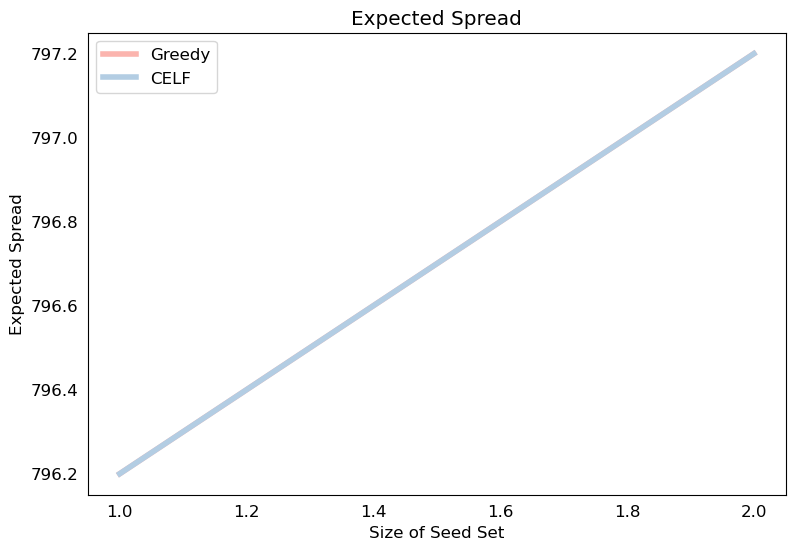

In [28]:
# change default style figure and font size
plt.rcParams['figure.figsize'] = 8, 6
plt.rcParams['font.size'] = 12

lw = 4
fig = plt.figure(figsize=(9,6))
ax = fig.add_subplot(111)
ax.plot(range(1, len(greedy_spreads) + 1), greedy_spreads, label="Greedy", color="#FBB4AE", lw=lw)
ax.plot(range(1, len(celf_spreads) + 1), celf_spreads, label="CELF", color="#B3CDE3", lw=lw)
ax.legend(loc=2)
plt.ylabel('Expected Spread')
plt.title('Expected Spread')
plt.xlabel('Size of Seed Set')
plt.tick_params(bottom=False, left=False)
plt.show()

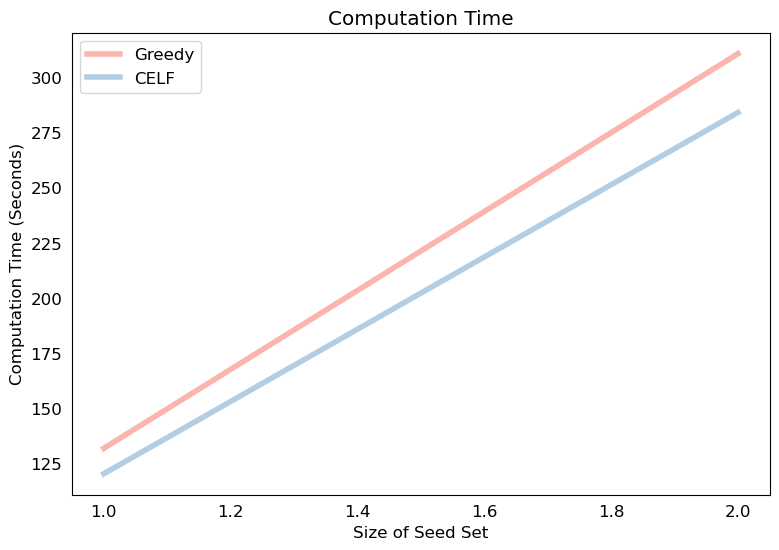

In [29]:
lw = 4
fig = plt.figure(figsize=(9,6))
ax = fig.add_subplot(111)
ax.plot(range(1, len(greedy_elapsed) + 1), greedy_elapsed, label="Greedy", color="#FBB4AE", lw=lw)
ax.plot(range(1, len(celf_elapsed) + 1), celf_elapsed, label="CELF", color="#B3CDE3", lw=lw)
ax.legend(loc=2)
plt.ylabel('Computation Time (Seconds)')
plt.xlabel('Size of Seed Set')
plt.title('Computation Time')
plt.tick_params(bottom=False, left=False)
plt.show()

## Version 2
- Source: https://hautahi.com/im_greedycelf

In [35]:
def IC(g,S,p=0.5,mc=1000):
    """
    Input:  graph object, set of seed nodes, propagation probability
            and the number of Monte-Carlo simulations
    Output: average number of nodes influenced by the seed nodes
    """
    
    # Loop over the Monte-Carlo Simulations
    spread = []
    for i in range(mc):
        
        # Simulate propagation process      
        new_active, A = S[:], S[:]
        while new_active:

            # For each newly active node, find its neighbors that become activated
            new_ones = []
            for node in new_active:
                
                # Determine neighbors that become infected
                np.random.seed(i)
                success = np.random.uniform(0,1,len(g.neighbors(node,mode="out"))) < p
                new_ones += list(np.extract(success, g.neighbors(node,mode="out")))

            new_active = list(set(new_ones) - set(A))
            
            # Add newly activated nodes to the set of activated nodes
            A += new_active
            
        spread.append(len(A))
        
    return(np.mean(spread))

def greedy2(g,k,p=0.1,mc=1000):
    """
    Input:  graph object, number of seed nodes
    Output: optimal seed set, resulting spread, time for each iteration
    """

    S, spread, timelapse, start_time = [], [], [], time.time()
    
    # Find k nodes with largest marginal gain
    for _ in (range(k)):
        print(f"{_}/{k}")

        # Loop over nodes that are not yet in seed set to find biggest marginal gain
        best_spread = 0
        for j in tqdm(set(range(g.vcount()))-set(S)):

            # Get the spread
            s = IC(g,S + [j],p,mc)

            # Update the winning node and spread so far
            if s > best_spread:
                best_spread, node = s, j

        # Add the selected node to the seed set
        S.append(node)
        
        # Add estimated spread and elapsed time
        spread.append(best_spread)
        timelapse.append(time.time() - start_time)

    return(S,spread,timelapse)

def celf2(g,k,p=0.1,mc=1000):  
    """
    Input:  graph object, number of seed nodes
    Output: optimal seed set, resulting spread, time for each iteration
    """
      
    # --------------------
    # Find the first node with greedy algorithm
    # --------------------
    
    # Calculate the first iteration sorted list
    start_time = time.time() 
    marg_gain = [IC(g,[node],p,mc) for node in range(g.vcount())]

    # Create the sorted list of nodes and their marginal gain 
    Q = sorted(zip(range(g.vcount()),marg_gain), key=lambda x: x[1],reverse=True)

    # Select the first node and remove from candidate list
    S, spread, SPREAD = [Q[0][0]], Q[0][1], [Q[0][1]]
    Q, LOOKUPS, timelapse = Q[1:], [g.vcount()], [time.time()-start_time]
    
    # --------------------
    # Find the next k-1 nodes using the list-sorting procedure
    # --------------------
    
    for _ in (range(k-1)):    
        print(f"{_}/{k-1}")

        check, node_lookup = False, 0
        
        while not check:
            
            # Count the number of times the spread is computed
            node_lookup += 1
            
            # Recalculate spread of top node
            current = Q[0][0]
            
            # Evaluate the spread function and store the marginal gain in the list
            Q[0] = (current,IC(g,S+[current],p,mc) - spread)

            # Re-sort the list
            Q = sorted(Q, key = lambda x: x[1], reverse = True)

            # Check if previous top node stayed on top after the sort
            check = (Q[0][0] == current)

        # Select the next node
        spread += Q[0][1]
        S.append(Q[0][0])
        SPREAD.append(spread)
        LOOKUPS.append(node_lookup)
        timelapse.append(time.time() - start_time)

        # Remove the selected node from the list
        Q = Q[1:]

    return(S,SPREAD,timelapse,LOOKUPS)

In [36]:
%%time
print('GREEDY ALGORITHM')

greedy_output = greedy2(graph,2,p = 0.1,mc = 100)
print("greedy output: " + str(greedy_output[0]))

GREEDY ALGORITHM
0/2


100%|██████████████████████████████████████████████████████████████████████████████| 1005/1005 [16:43<00:00,  1.00it/s]


1/2


100%|██████████████████████████████████████████████████████████████████████████████| 1004/1004 [27:46<00:00,  1.66s/it]

greedy output: [13, 5]
Wall time: 44min 30s


In [40]:
print("greedy spread: " + str(greedy_output[1]))

greedy spread: [609.95, 612.17]


In [37]:
%%time
print('CELF ALGORITHM')

celf_output   = celf2(graph,2,p = 0.1,mc = 100)
print("celf output:   " + str(celf_output[0]))

CELF ALGORITHM
0/1
celf output:   [13, 5]
Wall time: 38min 20s


In [41]:
print("celf spread: " + str(celf_output[1]))
print("celf lookups: " + str(celf_output[3]))

celf spread: [609.95, 612.17]
celf lookups: [1005, 821]


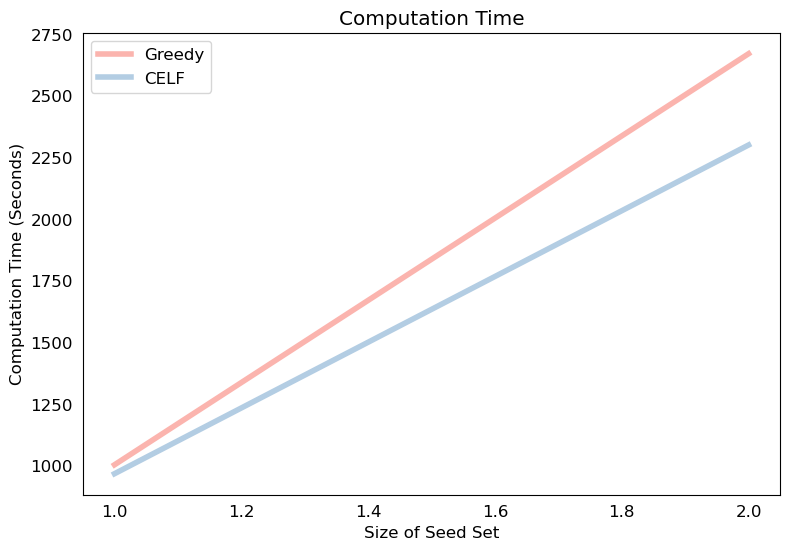

In [38]:
# Plot settings
plt.rcParams['figure.figsize'] = (9,6)
plt.rcParams['lines.linewidth'] = 4
plt.rcParams['xtick.bottom'] = False
plt.rcParams['ytick.left'] = False

# Plot Computation Time
plt.plot(range(1,len(greedy_output[2])+1),greedy_output[2],label="Greedy",color="#FBB4AE")
plt.plot(range(1,len(celf_output[2])+1),celf_output[2],label="CELF",color="#B3CDE3")
plt.ylabel('Computation Time (Seconds)'); plt.xlabel('Size of Seed Set')
plt.title('Computation Time'); plt.legend(loc=2);

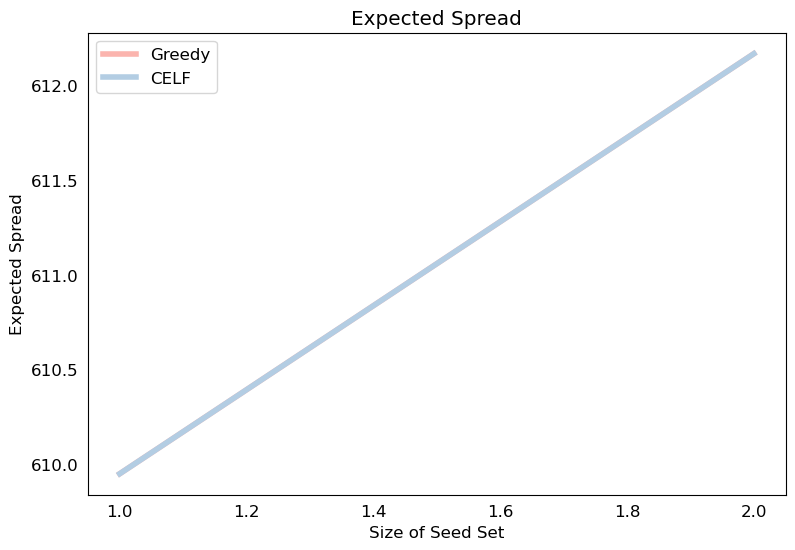

In [39]:
# Plot Expected Spread by Seed Set Size
plt.plot(range(1,len(greedy_output[1])+1),greedy_output[1],label="Greedy",color="#FBB4AE")
plt.plot(range(1,len(celf_output[1])+1),celf_output[1],label="CELF",color="#B3CDE3")
plt.xlabel('Size of Seed Set'); plt.ylabel('Expected Spread')
plt.title('Expected Spread'); plt.legend(loc=2);

# Influence Maximization - networkx
Source: https://github.com/AdnanRasad/Influence-Maximization-Analysis/tree/master/Kempe-Independent-Cascades-Model

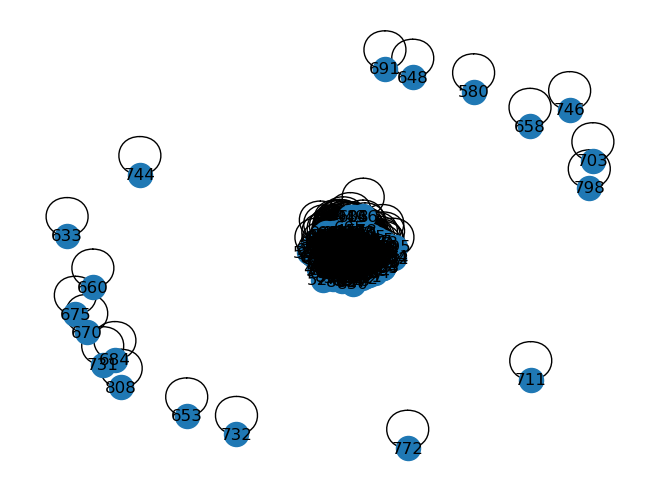

In [12]:
# Create graph
G = nx.from_pandas_edgelist(edges, 'node_1', 'node_2')

# Visualize the graph
nx.draw(G, with_labels=True)
plt.show()

## Functions

In [21]:
def IC(Networkx_Graph,Seed_Set,Probability,Num_of_Simulations):
    """
    Kempe Independent Cascades Model
    """
    spread = []
    for i in range(Num_of_Simulations):
        
        new_active, Ans = Seed_Set[:], Seed_Set[:]
        while new_active:
            #Getting neighbour nodes of newly activate node
            targets = Neighbour_finder(Networkx_Graph,Probability,new_active)
    
            #Calculating if any nodes of those neighbours can be activated, if yes add them to new_ones.
            np.random.seed(i)
            success = np.random.uniform(0,1,len(targets)) < Probability
            new_ones = list(np.extract(success, sorted(targets)))
            
            #Checking which ones in new_ones are not in our Ans...only adding them to our Ans so that no duplicate in Ans.
            new_active = list(set(new_ones) - set(Ans))
            Ans += new_active
            
        spread.append(len(Ans))
        
    return(np.mean(spread))
    
def Neighbour_finder(g,p,new_active):
    targets = []
    for node in new_active:
        targets += g.neighbors(node)

    return(targets)

def KempeGreedy(graph, num_seed_nodes, prob=0.2, n_iters=100):
   #Solution gives 2 parameters: the selected seed set for which we found the maximum influence & their influences
   #Here we used this method for Networkx Directed Graph
    max_spreads = []
    ultimate_seed_set = []
 
    for _ in range(num_seed_nodes):
        print(f"{_}/{num_seed_nodes}")
        best_node = -1
        best_spread = -np.inf

       
        nods = graph.nodes - ultimate_seed_set;

        for node in tqdm(nods):
            each_infl  = IC(graph, ultimate_seed_set + [node], prob, n_iters)
            if each_infl  > best_spread:
                best_spread = each_infl 
                best_node = node

        ultimate_seed_set.append(best_node)
        max_spreads.append(best_spread)
    return ultimate_seed_set, max_spreads

## Implementation

In [22]:
%%time
#num_seed_nodes=how many nodes we want for our best seed set.
num_seed_nodes = 2
prob = 0.2
n_iters=10

greedy_solution, greedy_spreads = KempeGreedy(G, num_seed_nodes, prob, n_iters)
print('solution: ', greedy_solution)
print('spreads: ', greedy_spreads)

100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [02:21<00:00, 70.99s/it]

solution:  [573, 81]
spreads:  [827.2, 828.2]
Wall time: 2min 21s
